# Embeddings for NLP

In [1]:
from importlib.metadata import version

import tiktoken
import torch

print("torch version:", version("torch"))
print("tiktoken version:", version("tiktoken"))

torch version: 2.0.1
tiktoken version: 0.11.0


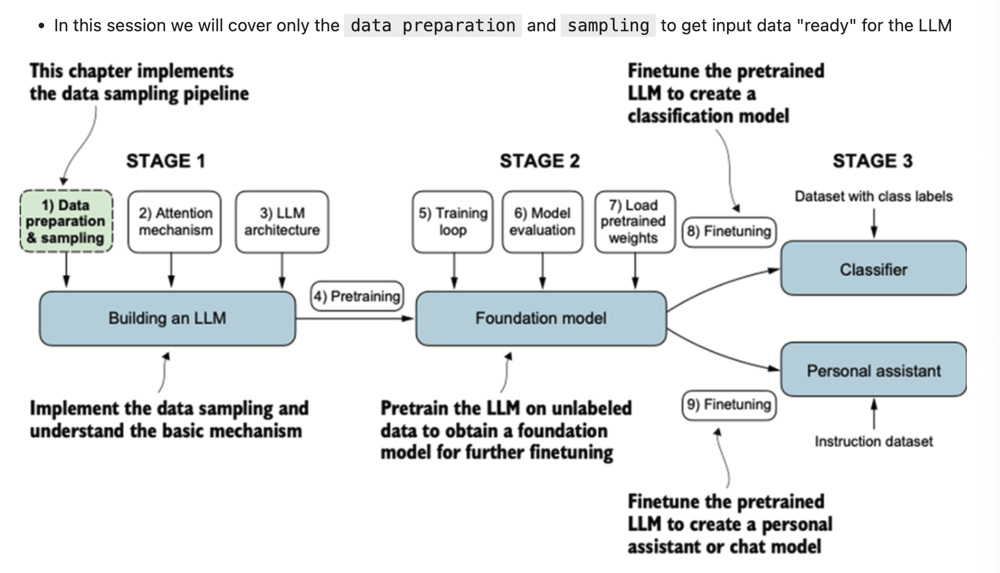

## Understanding word embeddings

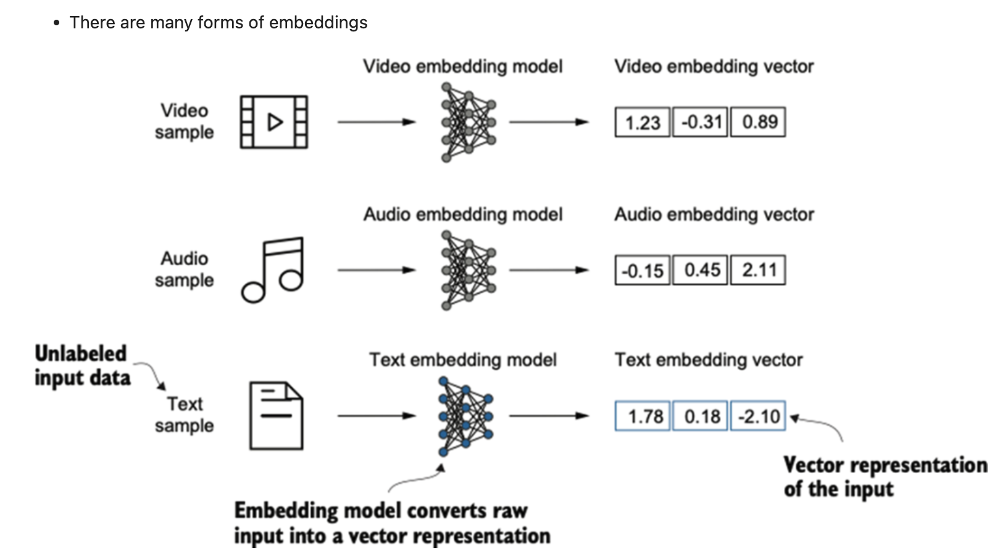

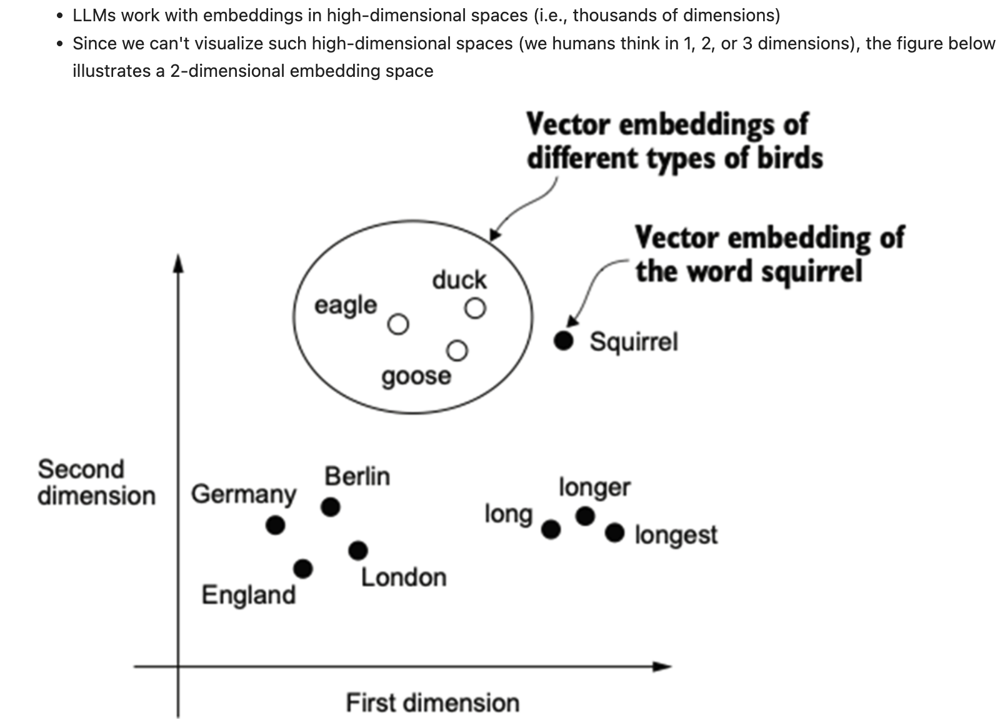

## Tokenizing text

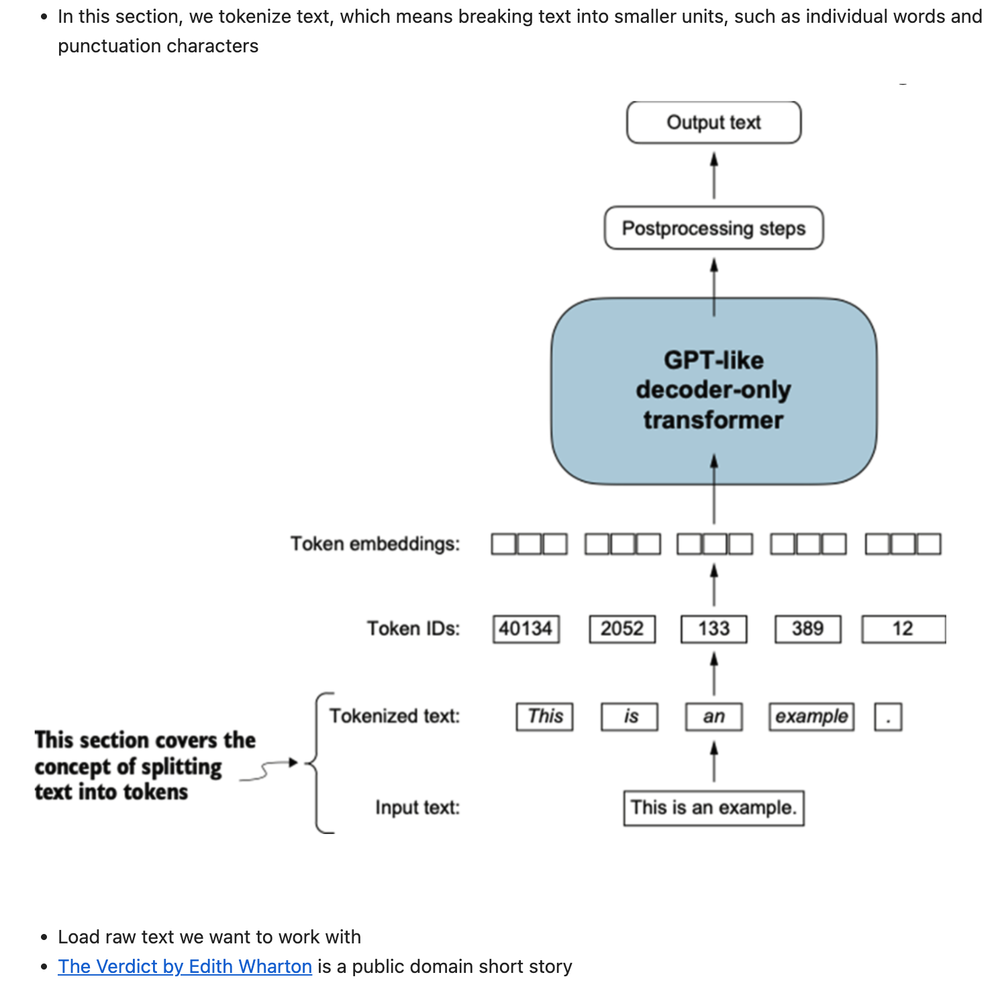

### Loading the dataset

In [2]:
# Reading the whole file 
with open("/Users/yintianyi/Downloads/the-verdict.txt", "r", encoding="utf-8") as f:
    raw_text = f.read()
    
print("Total number of character:", len(raw_text))
print(raw_text[:99])

Total number of character: 20479
I HAD always thought Jack Gisburn rather a cheap genius--though a good fellow enough--so it was no 


* The goal is to tokenize and embed this text for an LLM
* Let's develop a simple tokenizer based on some simple sample text that we can then later apply to the text above
* The following regular expression will split on whitespaces

In [3]:
import re

text = "Hello, world. This, is a test."
result = re.split(r'(\s)', text)

print(result)

['Hello,', ' ', 'world.', ' ', 'This,', ' ', 'is', ' ', 'a', ' ', 'test.']


* We don't only want to split on whitespaces but also commas and periods, so let's modify the regular expression to do that as well

In [5]:
result = re.split(r'([,.]|\s)', text)

print(result)

['Hello', ',', '', ' ', 'world', '.', '', ' ', 'This', ',', '', ' ', 'is', ' ', 'a', ' ', 'test', '.', '']


* As we can see, this creates empty strings, let's remove them

In [6]:
text = "Hello, world. Is this-- a test?"

result = re.split(r'([,.:;?_!"()\']|--|\s)', text)
result = [item.strip() for item in result if item.strip()]
print(result)

['Hello', ',', 'world', '.', 'Is', 'this', '--', 'a', 'test', '?']


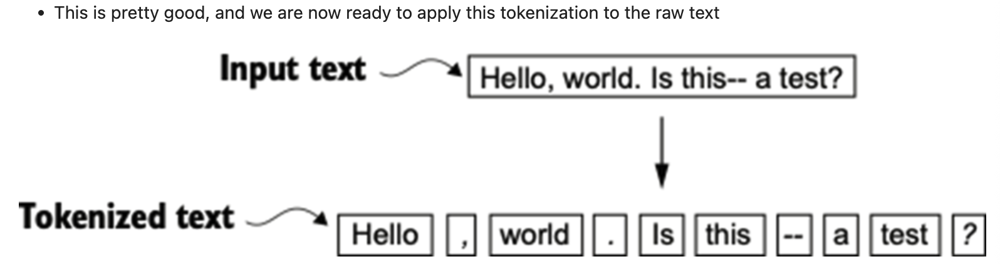

In [7]:
# Lets now tokenized our raw text using the regex
preprocessed = re.split(r'([,.?_!"()\']|--|\s)', raw_text)
preprocessed = [item.strip() for item in preprocessed if item.strip()]

# Printing the first 30 tokens
print(preprocessed[:30])
print(len(preprocessed))

['I', 'HAD', 'always', 'thought', 'Jack', 'Gisburn', 'rather', 'a', 'cheap', 'genius', '--', 'though', 'a', 'good', 'fellow', 'enough', '--', 'so', 'it', 'was', 'no', 'great', 'surprise', 'to', 'me', 'to', 'hear', 'that', ',', 'in']
4649


## Converting tokens into token IDs

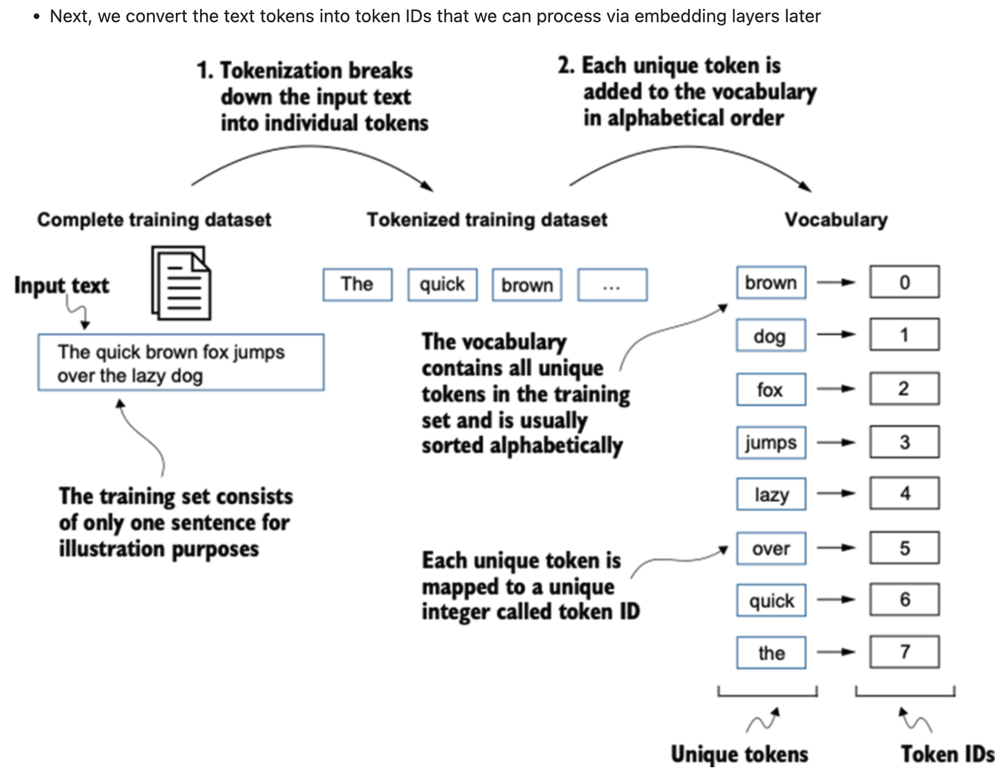

In [8]:
# Finding the unique words/tokens 
all_words = sorted(set(preprocessed))
vocab_size = len(all_words)

# Printing the total vocabulary size
print(vocab_size)

1159


In [9]:
vocab = {token:integer for integer,token in enumerate(all_words)}

In [10]:
# the first 50 entries in this vocabulary
# enumerate() lets you loop through a list (or any iterable)
# while also keeping track of the index of each item.
# Without it, you would need to manually keep a counter.
# enumerate() automatically adds an index for you.

for i, item in enumerate(vocab.items()):
    print(item)
    if i == 50:
        break

('!', 0)
('"', 1)
("'", 2)
('(', 3)
(')', 4)
(',', 5)
('--', 6)
('.', 7)
(':', 8)
(';', 9)
('?', 10)
('A', 11)
('Ah', 12)
('Among', 13)
('And', 14)
('Are', 15)
('Arrt', 16)
('As', 17)
('At', 18)
('Be', 19)
('Begin', 20)
('Burlington', 21)
('But', 22)
('By', 23)
('Carlo', 24)
('Carlo;', 25)
('Chicago', 26)
('Claude', 27)
('Come', 28)
('Croft', 29)
('Destroyed', 30)
('Devonshire', 31)
('Don', 32)
('Dubarry', 33)
('Emperors', 34)
('Florence', 35)
('For', 36)
('Gallery', 37)
('Gideon', 38)
('Gisburn', 39)
('Gisburns', 40)
('Grafton', 41)
('Greek', 42)
('Grindle', 43)
('Grindle:', 44)
('Grindles', 45)
('HAD', 46)
('Had', 47)
('Hang', 48)
('Has', 49)
('He', 50)


* Putting it now all together into a tokenizer class

A class is like a template for creating objects (things that store both data and behavior).
You use a class when you want to combine data + functions that act on that data.

SimpleTokenizerV1 (the class) describes what a tokenizer is,
and the defs inside describe what it can do.

In [11]:
class SimpleTokenizerV1:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = {i:s for s,i in vocab.items()}
    
    def encode(self, text):
        preprocessed = re.split(r'([,.?_!"()\']|--|\s)', text)
        preprocessed = [
                         item.strip() for item in preprocessed if item.strip()
                       ]
        ids = [self.str_to_int[s] for s in preprocessed]
        return ids
        
    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        # Replace spaces before the specified punctuations
        text = re.sub(r'\s+([,.?!"()\'])', r'\1', text)
        return text

In [13]:
# Let’s test it:
tokenizer = SimpleTokenizerV1(vocab)

text =  """It's the last he painted, you know, 
           Mrs. Gisburn said with pardonable pride."""
encoded = tokenizer.encode(text)
print(encoded)

decoded = tokenizer.decode(encoded)
print(decoded)  

[58, 2, 872, 1013, 615, 541, 763, 5, 1155, 608, 5, 69, 7, 39, 873, 1136, 773, 812, 7]
It' s the last he painted, you know, Mrs. Gisburn said with pardonable pride.


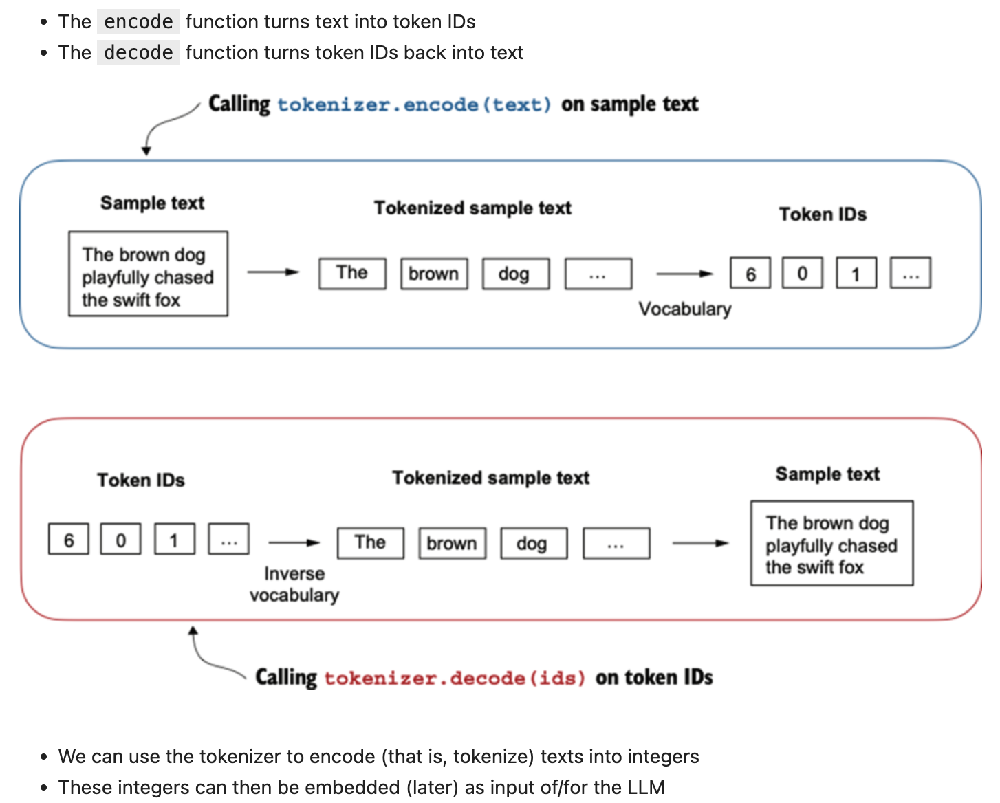

## Adding special context tokens

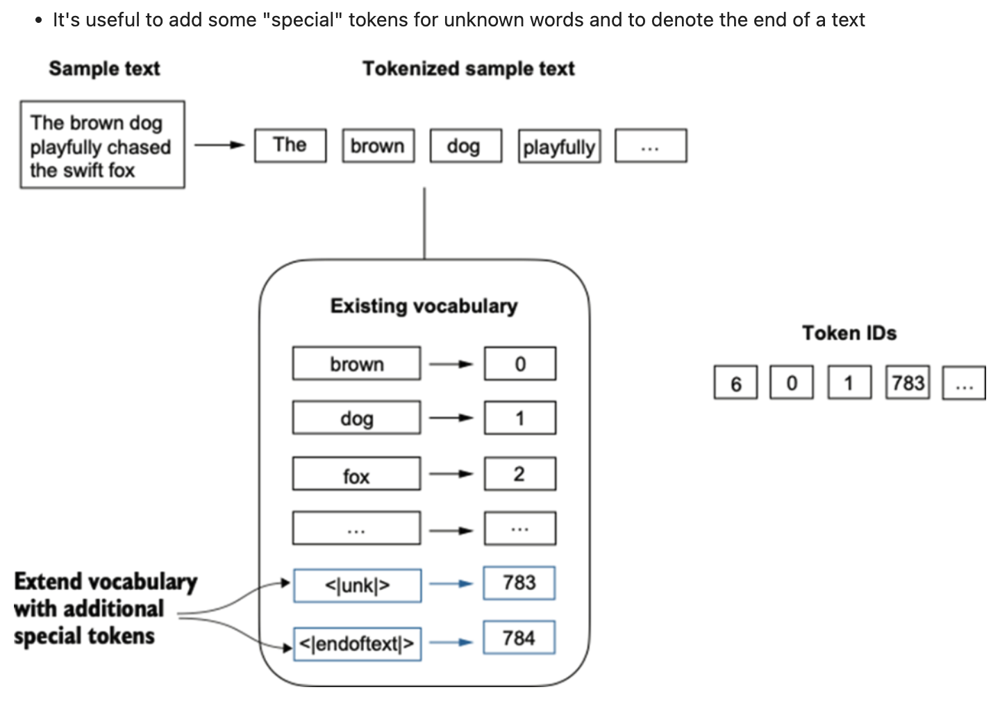

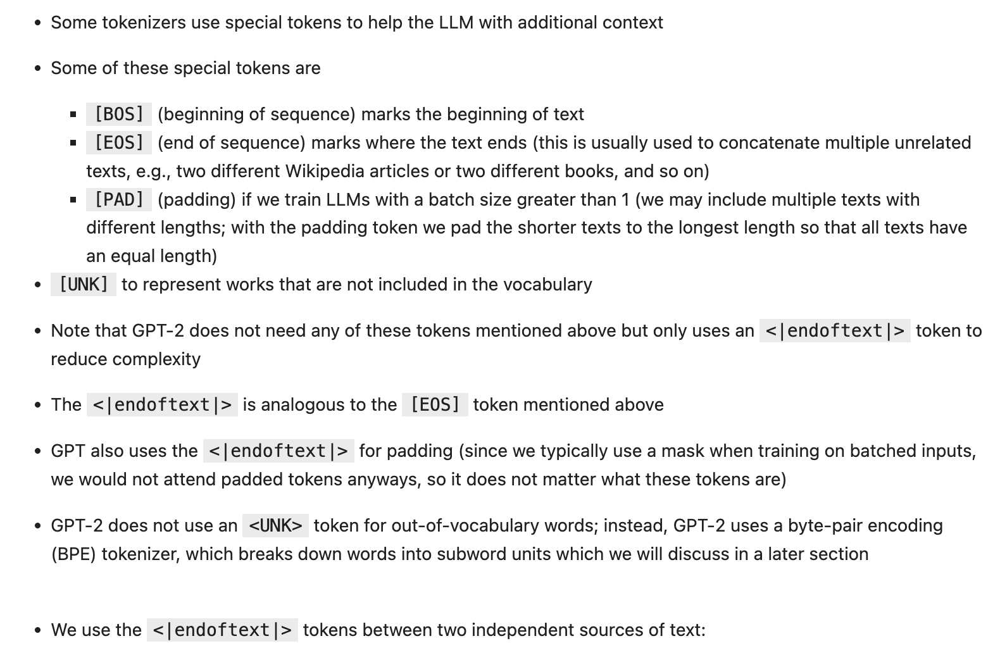

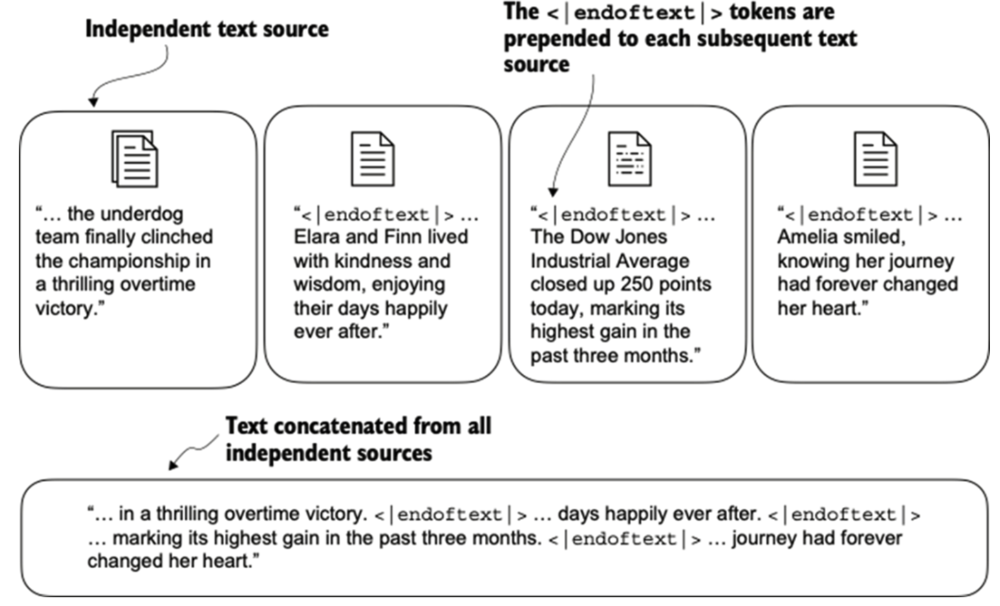

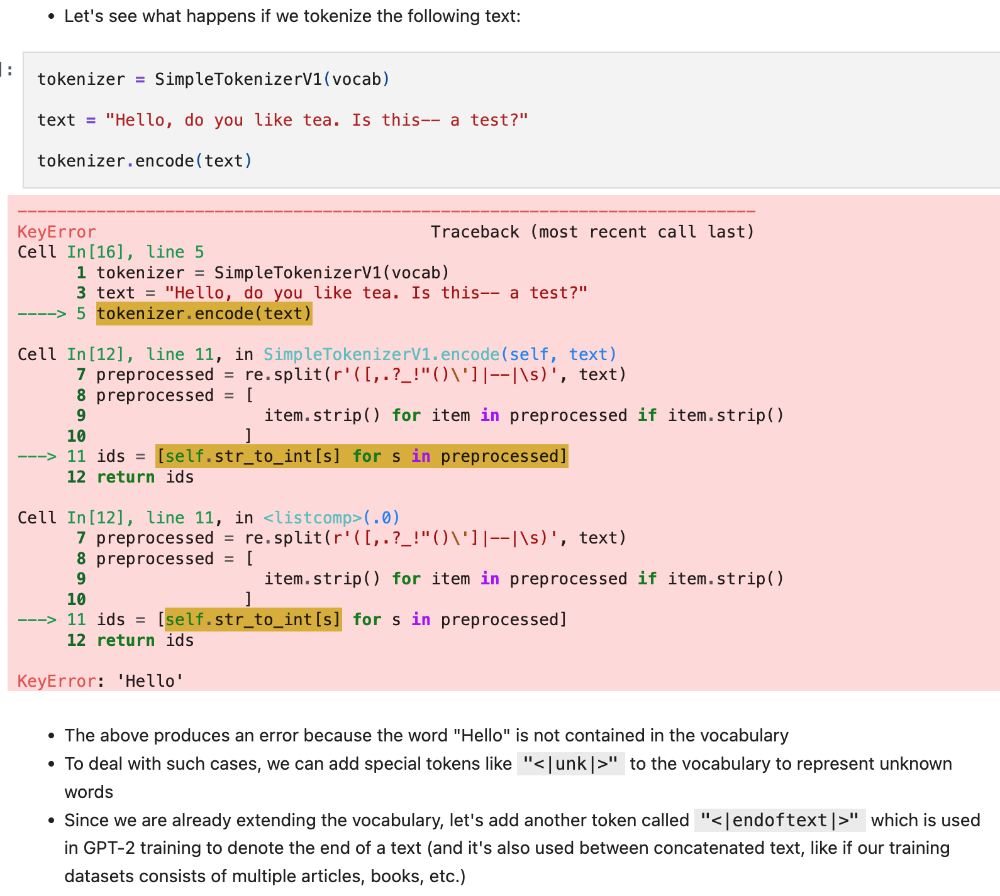

In [14]:
# Existing Vocab size
len(vocab)

1159

In [15]:
# Doing the same preprocessing and creating the vocab as before
preprocessed = re.split(r'([,.?_!"()\']|--|\s)', raw_text)
preprocessed = [item.strip() for item in preprocessed if item.strip()]

all_tokens = sorted(list(set(preprocessed))) 
#set():keep unique values 
#sorted(): for raking

# Adding these two extra tokens
all_tokens.extend(["<|endoftext|>", "<|unk|>"])

vocab = {token:integer for integer,token in enumerate(all_tokens)}

In [16]:
len(all_tokens)

1161

In [17]:
len(vocab.items())

1161

In [18]:
# Printing the last 5 tokens and its token ID 
for i, item in enumerate(list(vocab.items())[-5:]):
    print(item)

('younger', 1156)
('your', 1157)
('yourself', 1158)
('<|endoftext|>', 1159)
('<|unk|>', 1160)


* We also need to adjust the tokenizer accordingly so that it knows when and how to use the new `<unk>` token

In [19]:
class SimpleTokenizerV2:
    def __init__(self, vocab):
        self.str_to_int = vocab
        self.int_to_str = { i:s for s,i in vocab.items()}
    
    def encode(self, text):
        preprocessed = re.split(r'([,.?_!"()\']|--|\s)', text)
        preprocessed = [item.strip() for item in preprocessed if item.strip()]
        preprocessed = [
                            item if item in self.str_to_int 
                            else "<|unk|>" for item in preprocessed
                        ]

        ids = [self.str_to_int[s] for s in preprocessed]
        return ids
        
    def decode(self, ids):
        text = " ".join([self.int_to_str[i] for i in ids])
        # Replace spaces before the specified punctuations
        text = re.sub(r'\s+([,.?!"()\'])', r'\1', text)
        return text

In [20]:
# Let's try to tokenize text with the modified tokenizer:
tokenizer = SimpleTokenizerV2(vocab)

text1 = "Hello, do you like tea?"
text2 = "In the sunlit terraces of the palace."
text = " <|endoftext|> ".join((text1, text2))

encoded = tokenizer.encode(text)
print(encoded)

decoded = tokenizer.decode(encoded)
print(decoded) 

[1160, 5, 362, 1155, 642, 1000, 10, 1159, 57, 1013, 981, 1009, 738, 1013, 1160, 7]
<|unk|>, do you like tea? <|endoftext|> In the sunlit terraces of the <|unk|>.


# BytePair encoding

* GPT-2 used BytePair encoding (BPE) as its tokenizer
* It allows the model to break down words that aren't in its predefined vocabulary into smaller subword units or even individual characters, enabling it to handle out-of-vocabulary words
* For instance, if GPT-2's vocabulary doesn't have the word "unfamiliarword," it might tokenize it as ["unfam", "iliar", "word"] or some other subword breakdown, depending on its trained BPE merges
* The original BPE tokenizer can be found here https://github.com/openai/gpt-2/blob/master/src/encoder.py

In [21]:
pip install tiktoken

Note: you may need to restart the kernel to use updated packages.


In [22]:
import importlib
import tiktoken

print("tiktoken version:", importlib.metadata.version("tiktoken"))

tiktoken version: 0.11.0


In [23]:
tokenizer = tiktoken.get_encoding("gpt2")

In [24]:
# The vocabular size of `gpt-2` 
tokenizer.n_vocab

50257

In [25]:
tiktoken.list_encoding_names()

['gpt2',
 'r50k_base',
 'p50k_base',
 'p50k_edit',
 'cl100k_base',
 'o200k_base',
 'o200k_harmony']

In [27]:
tiktoken.get_encoding("cl100k_base").n_vocab

100277

In [28]:
text = (
            "Hello, do you like tea? <|endoftext|> In the sunlit terraces"
             "of someunknownPlace."
        )

integers = tokenizer.encode(text, allowed_special={"<|endoftext|>"})
print(integers)

strings = tokenizer.decode(integers)
print(strings)

[15496, 11, 466, 345, 588, 8887, 30, 220, 50256, 554, 262, 4252, 18250, 8812, 2114, 1659, 617, 34680, 27271, 13]
Hello, do you like tea? <|endoftext|> In the sunlit terracesof someunknownPlace.


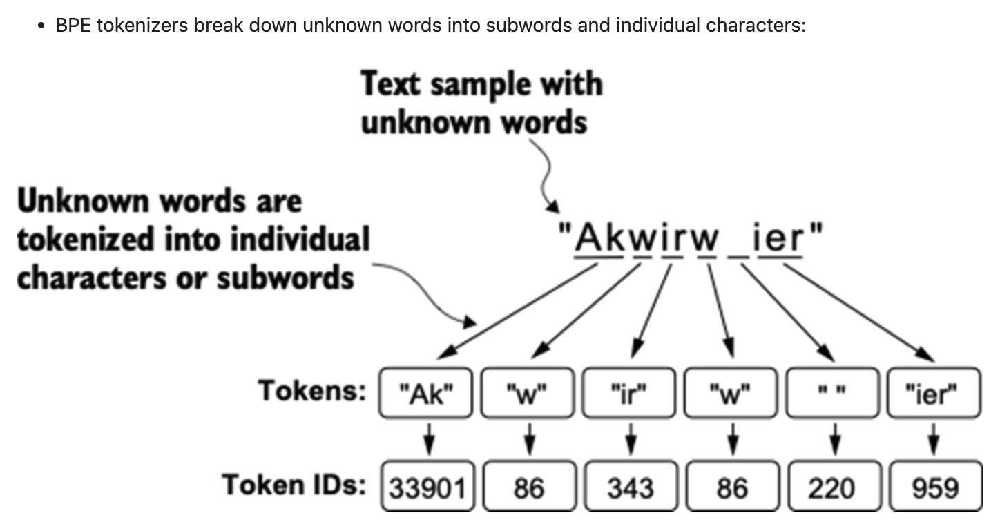

In [29]:
print(tokenizer.encode('Akwirw ier'))
print(tokenizer.decode([33901, 86, 343, 86, 220, 959]))

[33901, 86, 343, 86, 220, 959]
Akwirw ier


## Data sampling with a sliding window

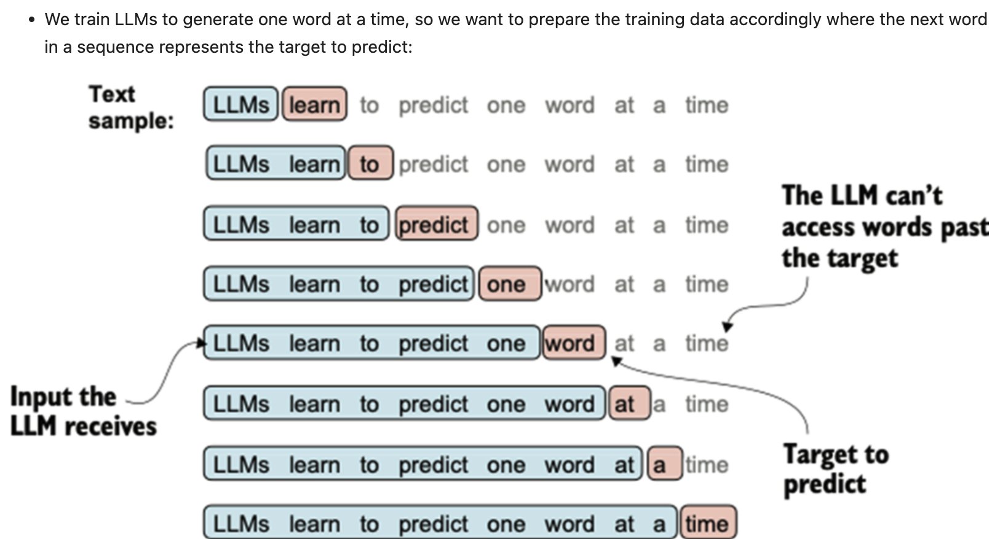

In [30]:
with open("/Users/yintianyi/Downloads/the-verdict.txt", "r", encoding="utf-8") as f:
    raw_text = f.read()

enc_text = tokenizer.encode(raw_text)

# The total number of tokens in the training set, after applying the BPE tokenizer.
print(len(enc_text))

5145


* For each text chunk, we want the inputs and targets
* Since we want the model to predict the next word, the targets are the inputs shifted by one position to the right

In [31]:
# We are just skipping the first 50 tokens
enc_sample = enc_text[50:]

context_size = 4
# Split the sequence into inputs and targets
x = enc_sample[:context_size]
y = enc_sample[1:context_size+1]

print(f"x: {x}")
print(f"y:      {y}")

x: [290, 4920, 2241, 287]
y:      [4920, 2241, 287, 257]


In [32]:
for i in range(1, context_size+1):
    context = enc_sample[:i] # take everything from the start of enc_sample up to (but not including) index i
    desired = enc_sample[i]

    print(context, "---->", desired)

[290] ----> 4920
[290, 4920] ----> 2241
[290, 4920, 2241] ----> 287
[290, 4920, 2241, 287] ----> 257


* We will take care of the next-word prediction in a later chapter after we covered the attention mechanism
* For now, we implement a simple data loader that iterates over the input dataset and returns the inputs and targets shifted by one

In [33]:
import torch
print("PyTorch version:", torch.__version__)

PyTorch version: 2.0.1


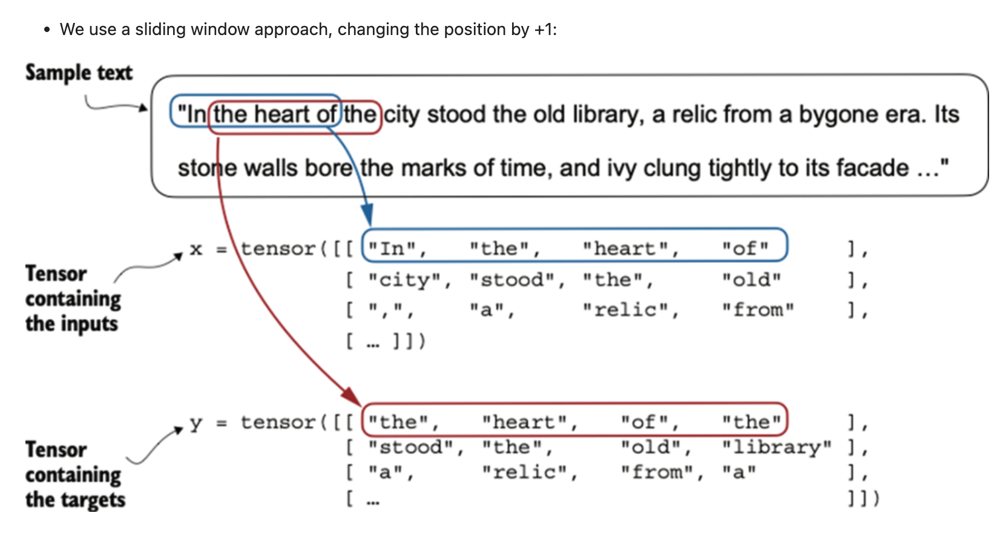

In [34]:
from torch.utils.data import Dataset, DataLoader


class MyDataset(Dataset):
    def __init__(self, txt, tokenizer, max_length, stride):
        self.input_ids = []
        self.target_ids = []

        # Tokenize the entire text
        token_ids = tokenizer.encode(txt, allowed_special={"<|endoftext|>"})

        # Use a sliding window to chunk the book into overlapping sequences of max_length
        for i in range(0, len(token_ids) - max_length, stride):
            input_chunk = token_ids[i:i + max_length]
            target_chunk = token_ids[i + 1: i + max_length + 1]
            self.input_ids.append(torch.tensor(input_chunk))
            self.target_ids.append(torch.tensor(target_chunk))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.target_ids[idx]

In [35]:
def create_dataloader_v1(txt, batch_size=4, max_length=256, 
                         stride=128, shuffle=True, drop_last=True,
                         num_workers=0):

    # Initialize the tokenizer
    tokenizer = tiktoken.get_encoding("gpt2")

    # Create dataset
    dataset = MyDataset(txt, tokenizer, max_length, stride)

    # Create dataloader
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=num_workers
    )

    return dataloader

In [36]:
# Let's test the dataloader with a batch size of 1 for an LLM with a context size of 4:
dataloader = create_dataloader_v1(
    raw_text, batch_size=1, max_length=4, stride=1, shuffle=False
)

data_iter = iter(dataloader)
first_batch = next(data_iter)
print(first_batch)

[tensor([[  40,  367, 2885, 1464]]), tensor([[ 367, 2885, 1464, 1807]])]


In [37]:
second_batch = next(data_iter)
print(second_batch)

[tensor([[ 367, 2885, 1464, 1807]]), tensor([[2885, 1464, 1807, 3619]])]


In [38]:
nums = [10, 20, 30]
it = iter(nums)
print(next(it))  # 10
print(next(it))  # 20
print(next(it))  # 30

10
20
30


🧩 **Batch size**
* When you train or test a model, you usually have a lot of data — for example, thousands of text samples or images. Instead of feeding all data to the model at once, we break it into smaller groups, called batches.
* Each batch is one mini dataset that goes through the model before updating weights (during training) or before predicting (during inference).
* Controls **how many samples** are processed together in one step.
* Example: batch_size=8 → the model sees 8 training examples in parallel.

🧩 **Max_length**
* Controls the **length (number of tokens)** in each individual sample.
* Example: max_length=256 → each input sequence is 256 tokens long.
* Each batch will have a shape like:`(batch_size, max_length)`

🧩 **Shuffle=True**

Every time you go through the dataset, the samples will be served in a random order instead of the same fixed order.


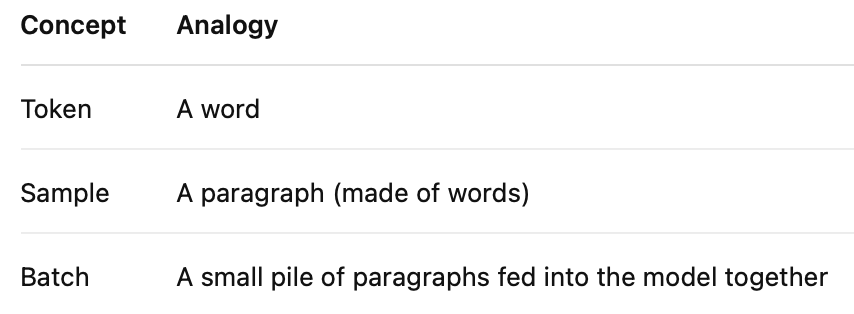

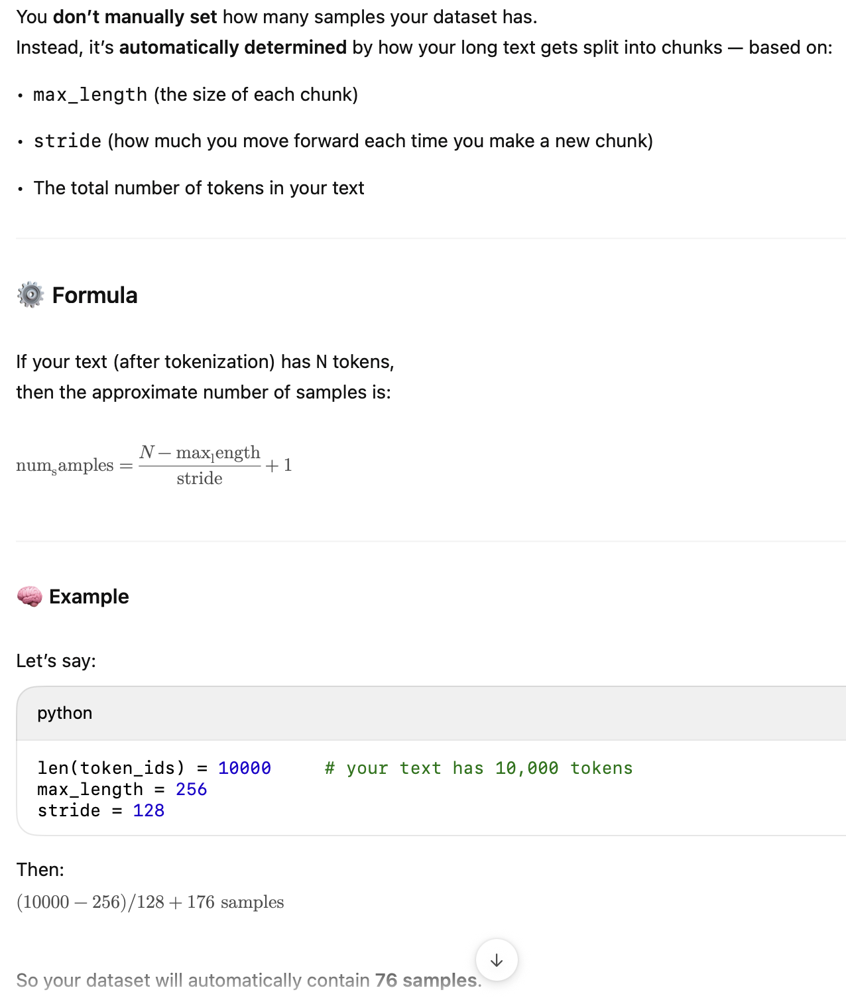

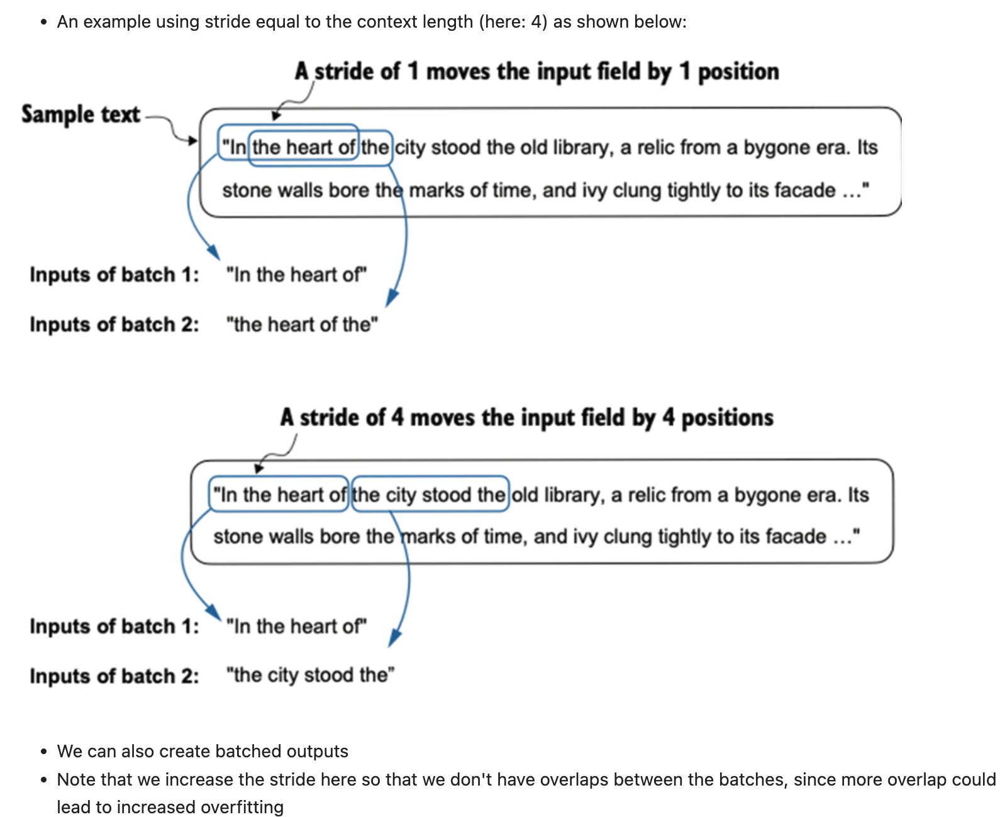

In [39]:
dataloader = create_dataloader_v1(raw_text, 
                                  batch_size=8, 
                                  max_length=4, 
                                  stride=4, 
                                  shuffle=False)

data_iter = iter(dataloader)
inputs, targets = next(data_iter)
print("Inputs:\n", inputs)
print("\nTargets:\n", targets)

Inputs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Targets:
 tensor([[  367,  2885,  1464,  1807],
        [ 3619,   402,   271, 10899],
        [ 2138,   257,  7026, 15632],
        [  438,  2016,   257,   922],
        [ 5891,  1576,   438,   568],
        [  340,   373,   645,  1049],
        [ 5975,   284,   502,   284],
        [ 3285,   326,    11,   287]])


In [ ]:
# if stride=1, the output should be like👇
[ 40, 367, 2885, 1464 ]
[367, 2885, 1464, 1807]
[2885, 1464, 1807, 3619]
...

## Creating token embeddings 

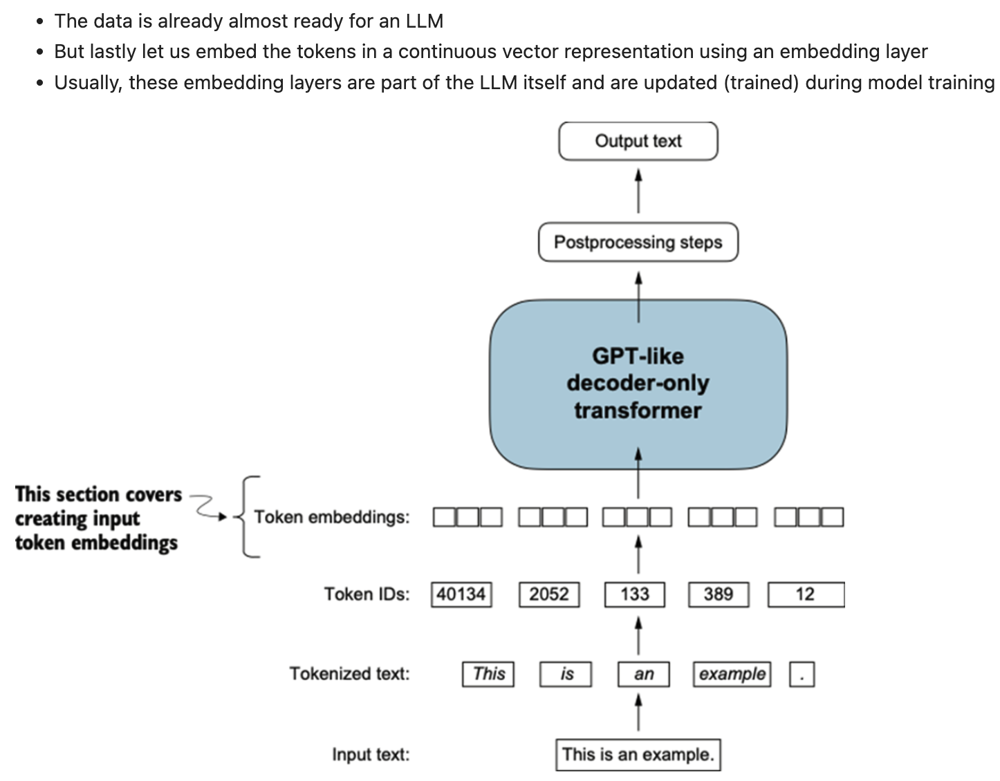

In [40]:
# For the sake of simplicity, suppose we have a small vocabulary of only 6 words 
# and we want to create embeddings of size 3:
vocab_size = 6 #词表里有 6 个 token（比如6个单词）
output_dim = 3 #每个 token 映射成一个 3维向量（embedding size = 3）

torch.manual_seed(123) # sets the random seed for PyTorch’s random number generator
embedding_layer = torch.nn.Embedding(vocab_size, output_dim)
# This would result in a 6x3 weight matrix:
print(embedding_layer.weight)

Parameter containing:
tensor([[ 0.3374, -0.1778, -0.1690],
        [ 0.9178,  1.5810,  1.3010],
        [ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-1.1589,  0.3255, -0.6315],
        [-2.8400, -0.7849, -1.4096]], requires_grad=True)


* For those who are familiar with one-hot encoding, the embedding layer approach above is essentially just a more efficient way of implementing one-hot encoding followed by matrix multiplication in a fully-connected layer
* Because the embedding layer is just a more efficient implementation that is equivalent to the one-hot encoding and matrix-multiplication approach it can be seen as a neural network layer that can be optimized via backpropagation

In [41]:
# To convert a token with id 3 into a 3-dimensional vector, we do the following:
print(embedding_layer(torch.tensor([3])))

tensor([[-0.4015,  0.9666, -1.1481]], grad_fn=<EmbeddingBackward0>)


* Note that the above is the 4th row in the `embedding_layer` weight matrix
* To embed all four `input_ids values` above, we do

In [42]:
# Suppose we have the following four input examples with input ids 2, 3, 5 and 1 (after tokenization):
input_ids = torch.tensor([2, 3, 5, 1])
input_ids

tensor([2, 3, 5, 1])

In [43]:
print(embedding_layer(input_ids))

tensor([[ 1.2753, -0.2010, -0.1606],
        [-0.4015,  0.9666, -1.1481],
        [-2.8400, -0.7849, -1.4096],
        [ 0.9178,  1.5810,  1.3010]], grad_fn=<EmbeddingBackward0>)


## Encoding word positions

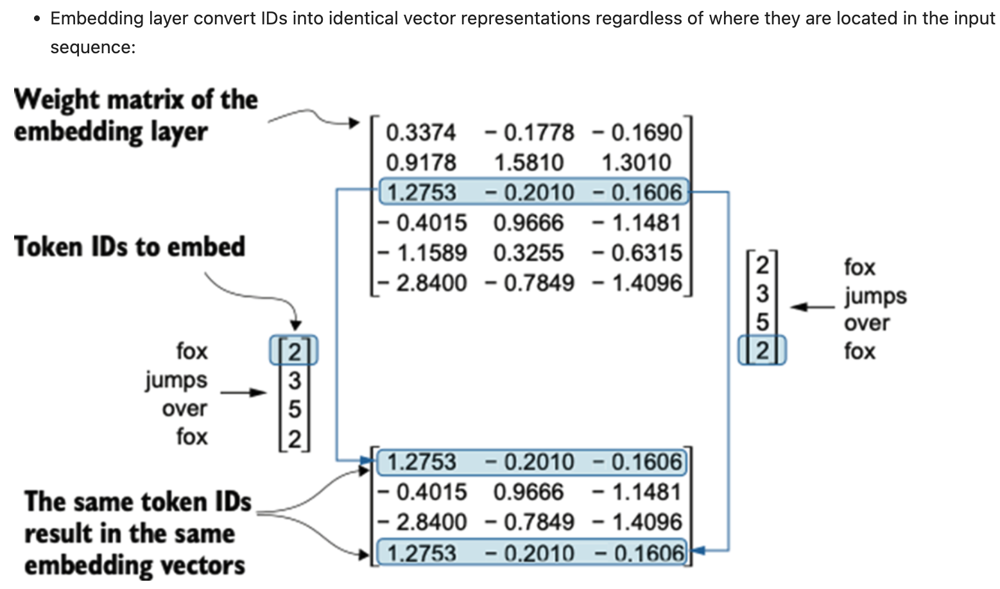

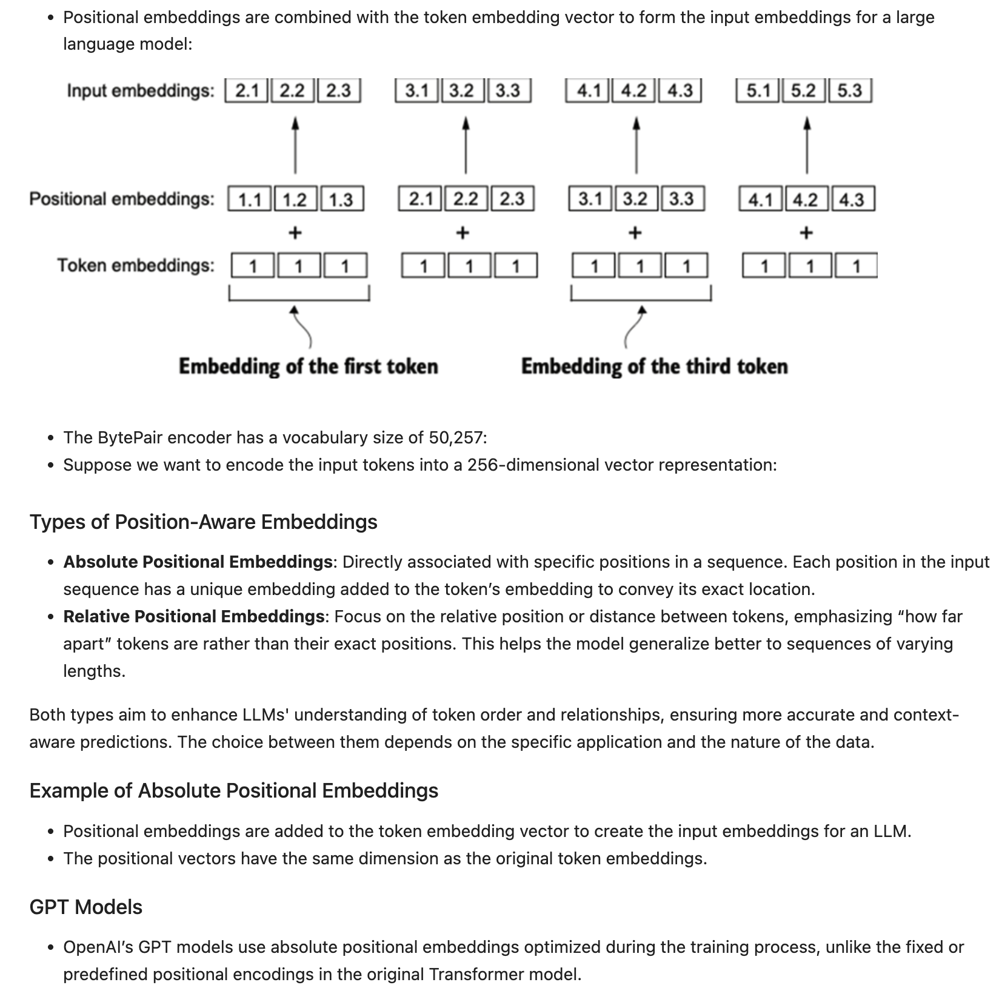

* If we sample data from the dataloader, we embed the tokens in each batch into a 256-dimensional vector
* If we have a batch size of 8 with 4 tokens each, this results in a 8 x 4 x 256 tensor:

In [44]:
max_length = 4
dataloader = create_dataloader_v1(
                                    raw_text, batch_size=8, max_length=max_length,
                                    stride=max_length, shuffle=False
                                )
data_iter = iter(dataloader)
inputs, targets = next(data_iter)
print("Token IDs:\n", inputs)
print("\nInputs shape:\n", inputs.shape)

Token IDs:
 tensor([[   40,   367,  2885,  1464],
        [ 1807,  3619,   402,   271],
        [10899,  2138,   257,  7026],
        [15632,   438,  2016,   257],
        [  922,  5891,  1576,   438],
        [  568,   340,   373,   645],
        [ 1049,  5975,   284,   502],
        [  284,  3285,   326,    11]])

Inputs shape:
 torch.Size([8, 4])


In [45]:
vocab_size = 50257
output_dim = 256

token_embedding_layer = torch.nn.Embedding(vocab_size, output_dim)

token_embeddings = token_embedding_layer(inputs)
print(token_embeddings.shape)

torch.Size([8, 4, 256])


In [46]:
# Create Positional Embeddings
context_length = max_length
pos_embedding_layer = torch.nn.Embedding(context_length, output_dim)
pos_embeddings = pos_embedding_layer(torch.arange(max_length))
print(pos_embeddings.shape)

torch.Size([4, 256])


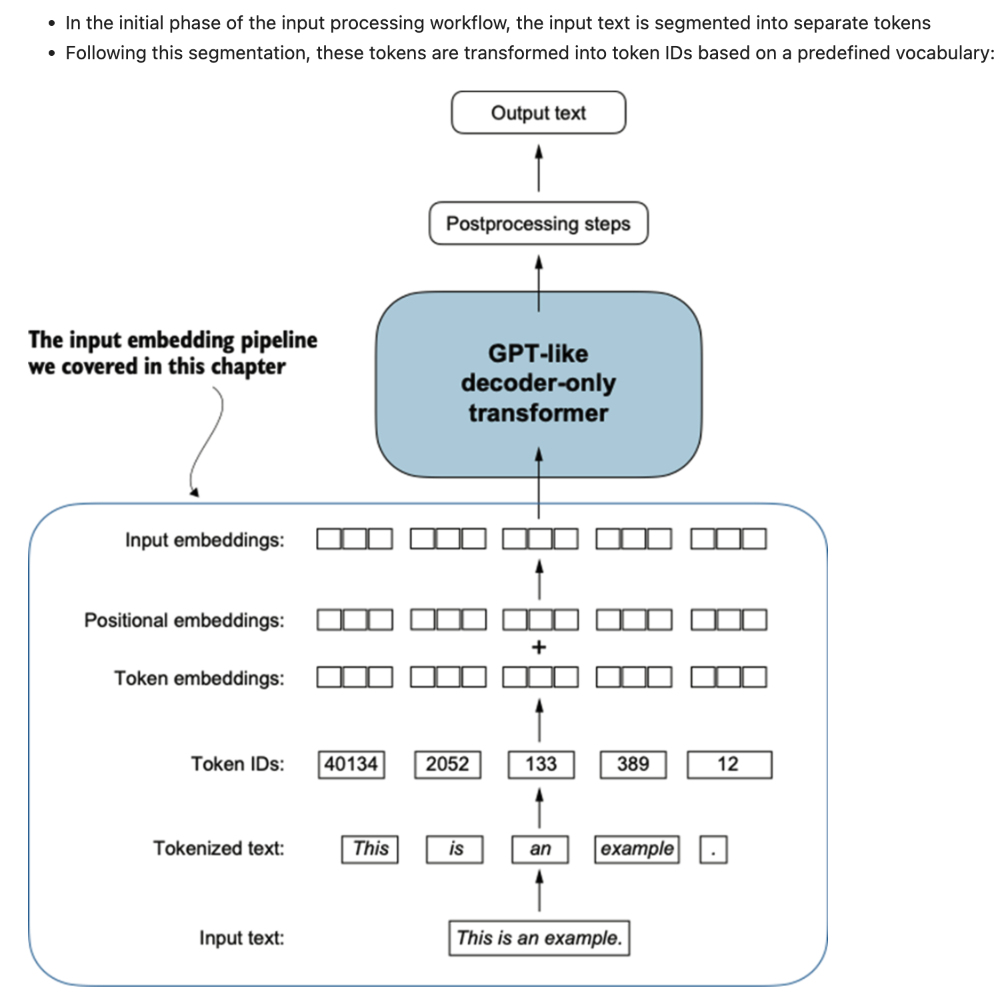